In [1]:
import pandas as pd
import numpy as np
import scipy
from pykalman.pykalman import *
import control

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)
from statannotations.Annotator import Annotator
import statsmodels.formula.api as smf
import statsmodels as stats

# Import custom modules
import prep_emotioncon 
import emotioncon_modelling
import emotioncon_stats
import auxiliary

In [2]:
# Create instances of the Modelling, Statistics, PrepEmotioncon, and Auxiliary classes
emo = emotioncon_modelling.Modelling() 
emostats = emotioncon_stats.Statistics() 
prep = prep_emotioncon.PrepEmotioncon()  
aux = auxiliary.Auxiliary()

attention_cr = np.array([1, 0, 0, 1, 1, 1, 1, 0, 0, 0])  # Define the attention check criteria as an array
mood_categories = ['disgusted', 'amused', 'calm', 'anxious', 'sad']  # Define the mood categories as a list
group_label = ['control', 'distancing'] # Define the group label as a list
filepath = '../'  # Specify the file path
debug = True  # Flag to indicate whether to save file and figures or not

In [3]:
# Load data from a numpy file
data = np.load(filepath + 'results/data_experiment.npy', allow_pickle=True)

# Process the loaded data into a DataFrame, mood ratings, and other related variables
df, mood_ratings, foo = prep.create_df_from_dict(data)

# Create inputs based on videos shown during experiment
inp = emo.input_from_videos('../experiment/public/prep/videosForExperiment.csv')

# Calculate the number of subjects based on the length of the loaded data
Nsj = len(data)
print('N = ' + str(Nsj))

N = 108


----------------------------------------------------------------------------------------------------
Model Comparison:
--
- only noise: S and G diagonal, no transition (A) matrix, no control (C) matrix -> no inputs
- dynamics + noise: S and G diagonal, transition matrix (A) but no control (C) matrix -> no inputs
- control + noise: S and G diagonal, control (C) matrix
- control, dynamics + noise: S and G, transition (A) and control (C) matrix

In [4]:
# List of different parameter constellations for fitting the Kalman Filter
fitting_combinations = [['S', 'G'], ['A', 'S', 'G'], ['A', 'h', 'S', 'G'], ['C', 'S', 'G'], \
                        ['A', 'C', 'S', 'G'], ['A', 'h', 'C', 'S', 'G']]

# Filter out the fitting combinations that include 'C' in them
fitting_combinations_C = [i for i in fitting_combinations if 'C' in i]

# Create an empty array to store log-likelihood values for each fitting combination and subject
ll_all_subjects = np.empty((len(fitting_combinations + fitting_combinations_C), Nsj))

# Iterate over each subject and fit the Kalman Filter using different parameter constellations
for sj in range(Nsj):
    # Get the mood rating data for the current subject
    data_to_fit = mood_ratings[:,:,sj]
    
    # Calculate the number of time points for the current subject's data
    T = np.shape(data_to_fit)[0]
    
    # Define the Kalman Filter options based on the data and input matrix
    opt = emo.define_kf_options(data_to_fit, inp)
    
    # Initialize an empty list to store results for each parameter constellation
    results = []
    
    # Fit the Kalman Filter for each parameter constellation in fitting_combinations
    for j, i in enumerate(fitting_combinations):
        opt['em_vars'] = emo.parameter_short(i)
        kf_alldata = emo.run_KF(data_to_fit, opt)
        ll_all_subjects[j, sj] = kf_alldata.loglikelihood(data_to_fit, control_inputs=inp)
        results.append(kf_alldata)
        
    # Fit the Kalman Filter with constraint control for each parameter constellation in fitting_combinations_C
    for j, i in enumerate(fitting_combinations_C):
        opt['constraint control'] = True
        opt['em_vars'] = emo.parameter_short(i)
        kf_alldata = emo.run_KF(data_to_fit, opt)
        ll_all_subjects[j + len(fitting_combinations), sj] = kf_alldata.loglikelihood(data_to_fit, control_inputs=inp)
        results.append(kf_alldata)

    # Store the results and log-likelihood values in the data dictionary for the current subject
    data[sj]['results'] = results
    data[sj]['ll'] = ll_all_subjects[:, sj]

# Save the data with fitted models and log-likelihood values to a numpy file
if debug == False:
    np.save(filepath + 'results/fit_experiment.npy', data)

In [5]:
# Load data from a numpy file
data = np.load(filepath + 'results/fit_experiment.npy', allow_pickle=True)

foo, bic, bestmodel = emo.KF_comparison(data, 'll', np.array([10, 35, 40, 35, 60, 65, 40, 45, 50]), \
                                            len(data[0]['ll']))

# Create a histogram to analyze the distribution of the best models across all subjects
# The histogram shows the count of occurrences for each best model index
histogram = np.histogram(bestmodel, range=(0, len(data[0]['ll'])), bins=len(data[0]['ll']))
    
# Calculate accumulative weight
for i in range(len(bic)):
    print(np.exp(-(bic[i]-min(bic)))/sum(np.exp(-(bic-min(bic)))))

9.385507288524522e-305
3.42380912793256e-48
1.8742911179670958e-55
9.89048204545223e-35
0.9999999999954774
4.5226653212368475e-12
2.911048281042192e-257
6.717611967910067e-179
1.3620897252398372e-188


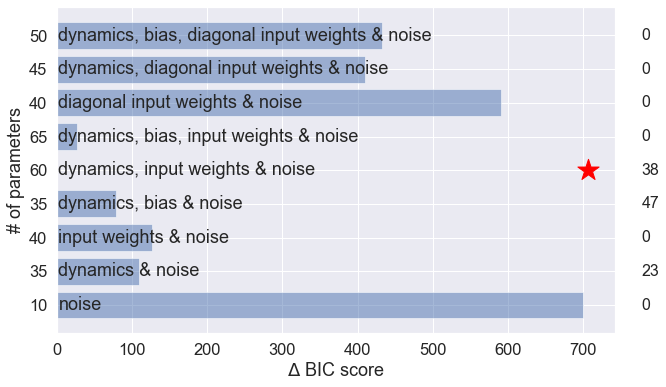

In [6]:
# Plot BIC 
fitting_labels = ['dynamics, bias, diagonal input weights & noise', \
                  'dynamics, diagonal input weights & noise', \
                  'diagonal input weights & noise', \
                  'dynamics, bias, input weights & noise', \
                  'dynamics, input weights & noise', \
                  'dynamics, bias & noise', \
                  'input weights & noise', \
                  'dynamics & noise', \
                  'noise']
fig, ax = plt.subplots(figsize=(10, 6))
emo.plot_BIC(fig, ax, bic, fitting_labels, [10, 35, 40, 35, 60, 65, 40, 45, 50], bestmodel)

----------------------------------------------------------------------------------------------------
Model Comparison before and after:
--
- all parameter same
- dynamics matrix differs before and after
- control matrix differs before and after
- control and dynamics matrices differ before and after
- noise covariances differ before and after
- dynamics matrix and noise covariances differ before and after
- control matrix and noise covariances differ before and after
- control, dynamics matrices, and noise covariances differ before and after

In [7]:
# List of different parameter constellations allowing to differ before and after intervention
fitting_combinations = [['A'], ['C'], ['A', 'C'], ['S', 'G'], ['A', 'S', 'G'], \
                        ['C', 'S', 'G'], ['A', 'C', 'S', 'G']]

# Array to store loglikelihood values for each subject and parameter constellation
ll_all_subjects = np.empty((len(fitting_combinations) + 1, Nsj))

# Loop through each subject
for sj in range(Nsj):
    # Get the mood ratings data for the subject
    data_to_fit = mood_ratings[:, :, sj]
    T = np.shape(data_to_fit)[0]
    
    # Define KF options and set initial parameter constellation
    opt = emo.define_kf_options(data_to_fit, inp)
    opt['em_vars'] = emo.parameter_short(['A', 'C', 'S', 'G'])
    kf_alldata = emo.run_KF(data_to_fit, opt)
    
    # Calculate loglikelihood for the initial parameter constellation
    ll = [kf_alldata.loglikelihood(data_to_fit, control_inputs=inp)]
    results = [kf_alldata]
    
    # Save the initial options for later use
    opt = emo.save_kf_options(kf_alldata, opt)
    
    # Loop through each parameter constellation to fit KF before and after intervention
    for i in fitting_combinations:
        ll_split = 0
        
        # Split data and inputs into two parts (before and after intervention)
        for t in range(2):
            mood_ratings_split = data_to_fit[t*int(T/2):t*int(T/2) + int(T/2), :]
            inputs_split = inp[t*int(T/2):t*int(T/2) + int(T/2), :]
            opt['inp'] = inputs_split 
            opt['em_vars'] = emo.parameter_short(i)
            
            # Fit KF to each split and calculate loglikelihood
            kf = emo.run_KF(mood_ratings_split, opt)
            ll_split += kf.loglikelihood(mood_ratings_split, control_inputs=inputs_split)
            results.append(kf)
        
        # Store the total loglikelihood for each parameter constellation
        ll.append(ll_split)
    
    ll_all_subjects[:, sj] = np.asarray(ll)
    
    # Store the results and loglikelihood values in the data dictionary for each subject
    data[sj]['results_split'] = results
    data[sj]['ll_split'] = ll_all_subjects[:, sj]

# Save the data if not in debug mode
if debug == False:
    np.save(filepath + 'results/fit_experiment.npy', data)

In [8]:
# Load data from a numpy file
data = np.load(filepath + 'results/fit_experiment.npy', allow_pickle=True)

foo, bic, bestmodel = emo.KF_comparison(data, 'll_split',  np.array([60, 85, 85, 110, 70, 95, 95, 120]), \
                                            len(data[0]['ll_split']))

# Create a histogram to analyze the distribution of the best models across all subjects
# The histogram shows the count of occurrences for each best model index
histogram = np.histogram(bestmodel, range=(0, len(data[0]['ll_split'])), bins=len(data[0]['ll_split']))

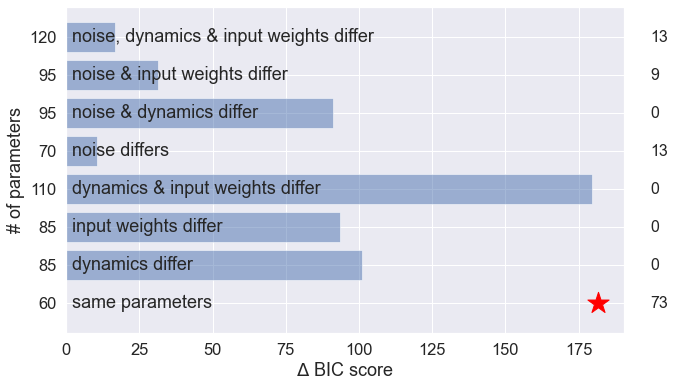

In [9]:
# plot BIC for models allowing to parameters to differ before and after intervention
fitting_labels = ['noise, dynamics & input weights differ', \
                  'noise & input weights differ', \
                  'noise & dynamics differ', \
                  'noise differs', \
                  'dynamics & input weights differ', \
                  'input weights differ', \
                  'dynamics differ', \
                  'same parameters']
fig, ax = plt.subplots(figsize=(10, 6))
emo.plot_BIC(fig, ax, bic, fitting_labels, [60, 85, 85, 110, 70, 95, 95, 120], bestmodel)

[1. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 1.]


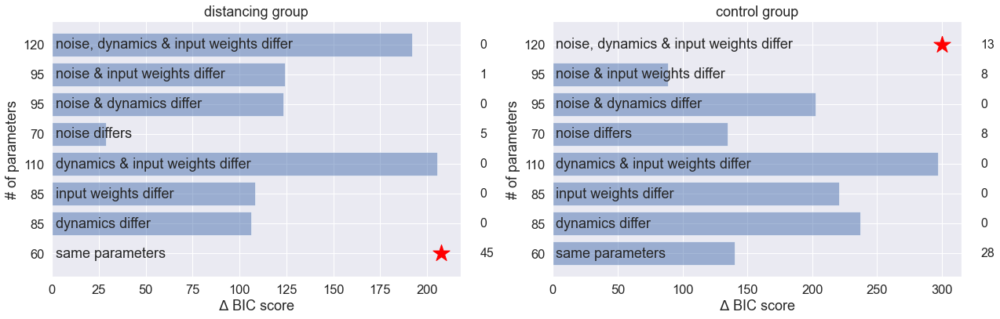

In [10]:
# Plot BIC separated for intervention condition
fig, ax = plt.subplots(1,2,figsize=(18, 6))
condition_label = ['distancing group', 'control group']
for i in range(2):
    foo, bic, bestmodel = emo.KF_comparison(data[df['randomized_condition']==i], 'll_split',  \
                                      np.array([60, 85, 85, 110, 70, 95, 95, 120]), len(data[0]['ll_split']))
    print(np.round(np.exp(-(bic-min(bic)))/sum(np.exp(-(bic-min(bic)))),3))
    emo.plot_BIC(fig, ax[i], bic, fitting_labels, [60, 85, 85, 110, 70, 95, 95, 120], bestmodel)
    ax[i].title.set_text(condition_label[i])
fig.tight_layout()

subject: 0, group: 1.0


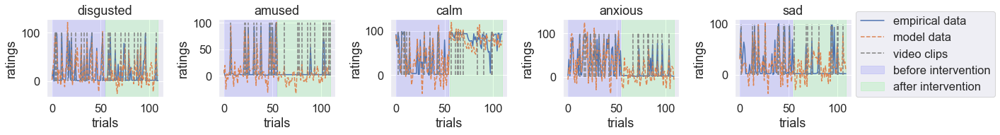

subject: 1, group: 1.0


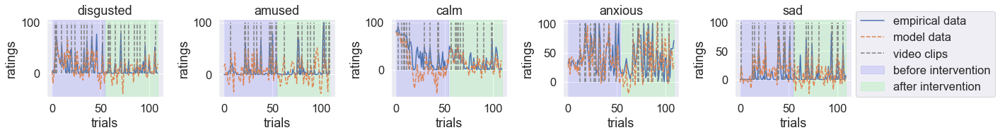

subject: 2, group: 1.0


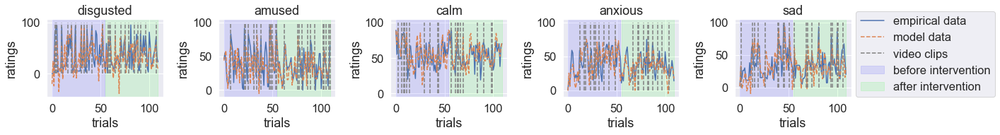

subject: 3, group: 0.0


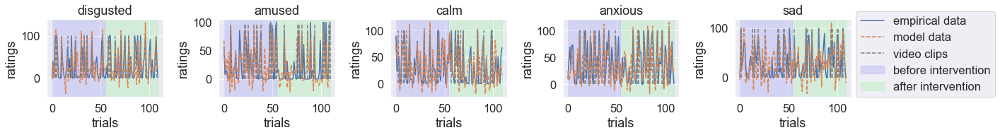

subject: 4, group: 1.0


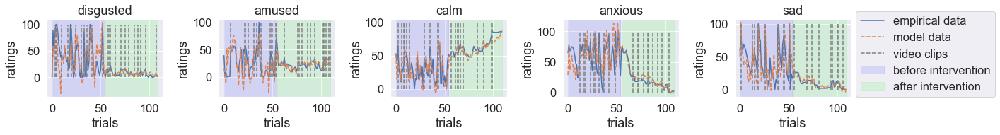

subject: 5, group: 0.0


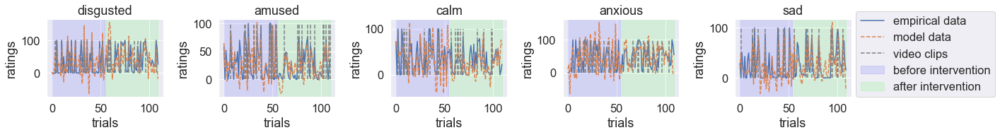

subject: 6, group: 1.0


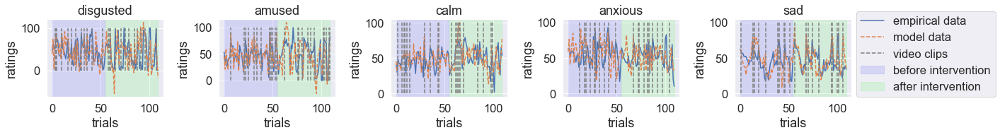

subject: 7, group: 0.0


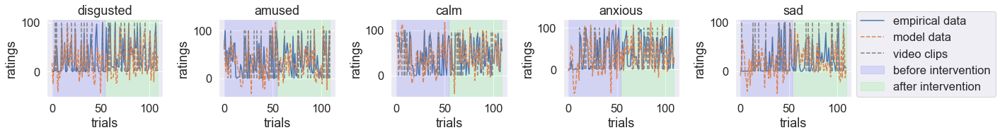

subject: 8, group: 0.0


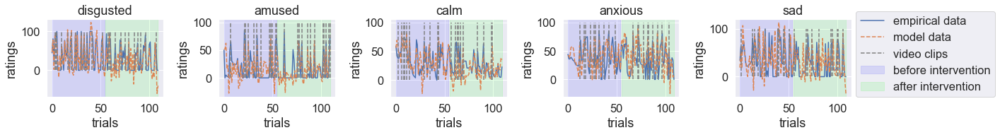

subject: 9, group: 0.0


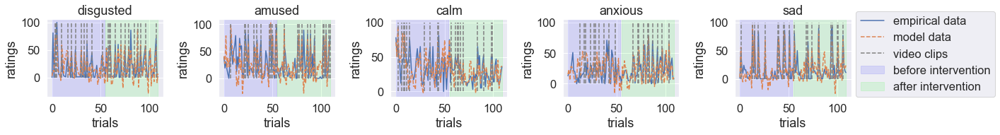

subject: 10, group: 0.0


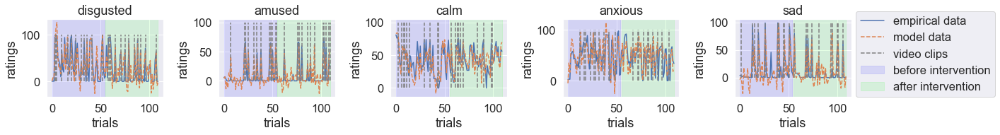

subject: 11, group: 1.0


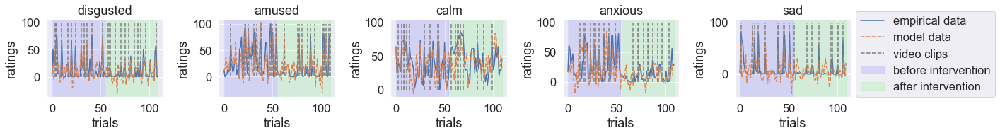

subject: 12, group: 1.0


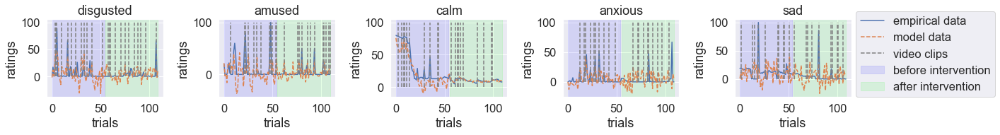

subject: 13, group: 0.0


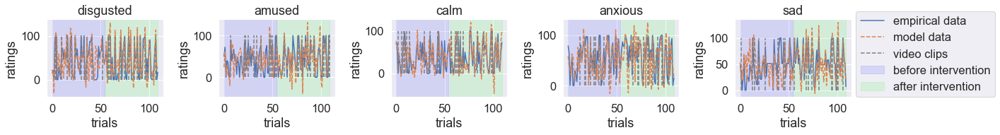

subject: 14, group: 0.0


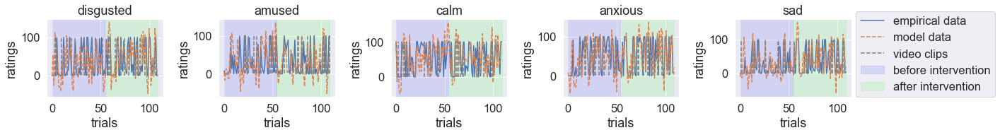

subject: 15, group: 1.0


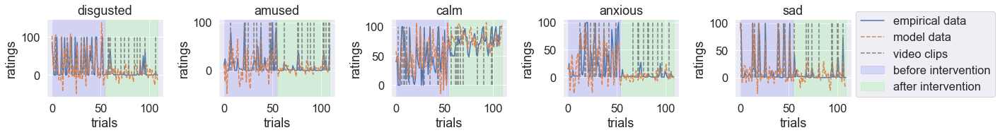

subject: 16, group: 0.0


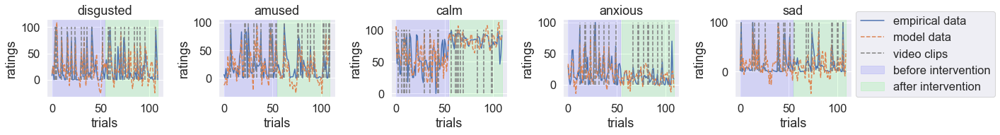

subject: 17, group: 0.0


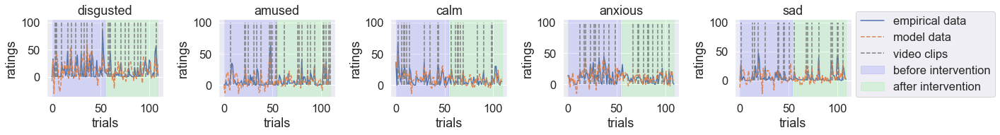

subject: 18, group: 1.0


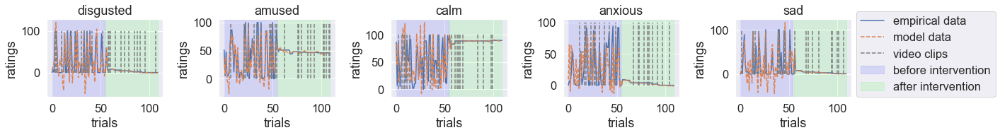

subject: 19, group: 0.0


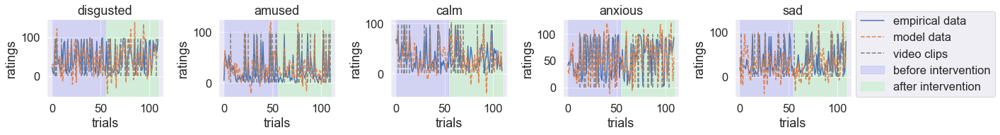

subject: 20, group: 0.0


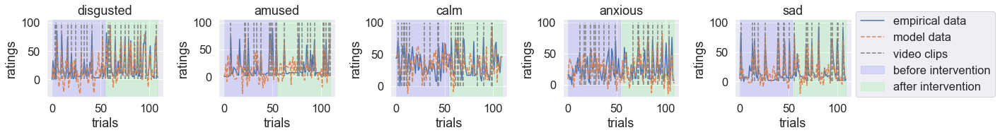

subject: 21, group: 0.0


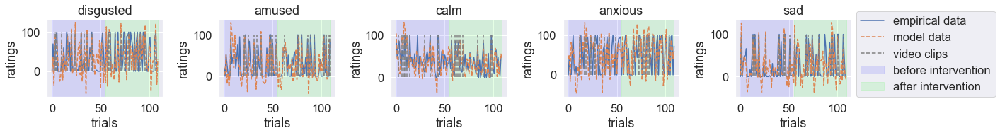

subject: 22, group: 1.0


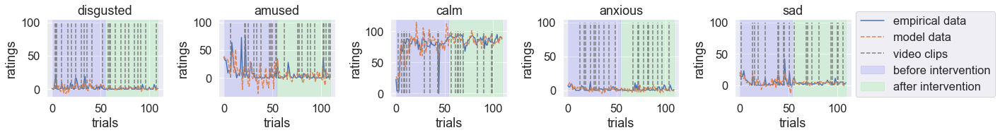

subject: 23, group: 1.0


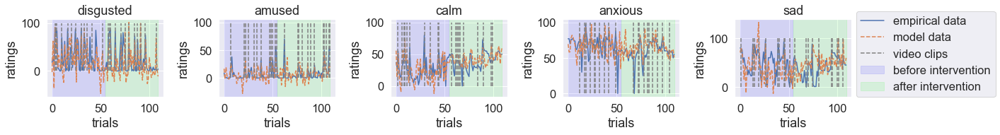

subject: 24, group: 1.0


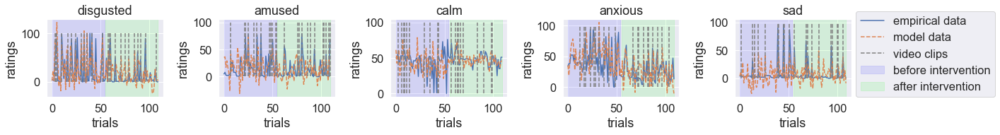

subject: 25, group: 1.0


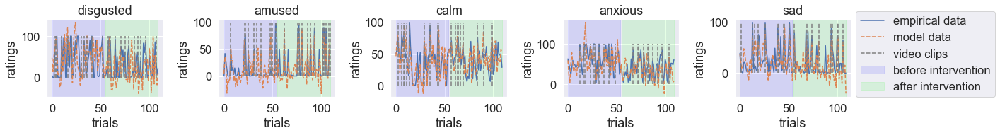

subject: 26, group: 0.0


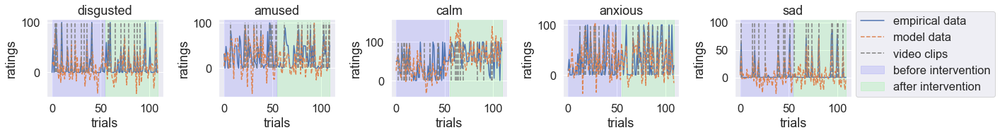

subject: 27, group: 1.0


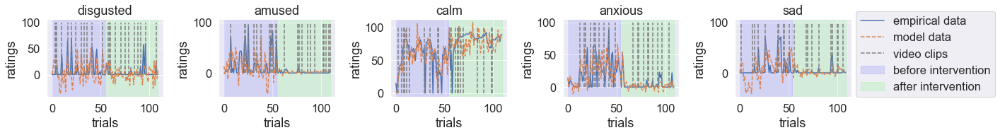

subject: 28, group: 0.0


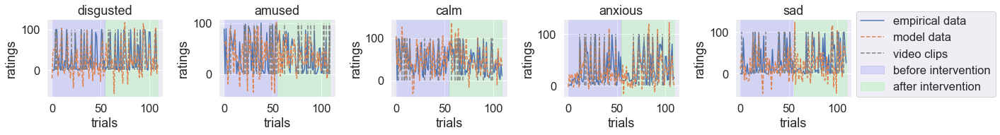

subject: 29, group: 0.0


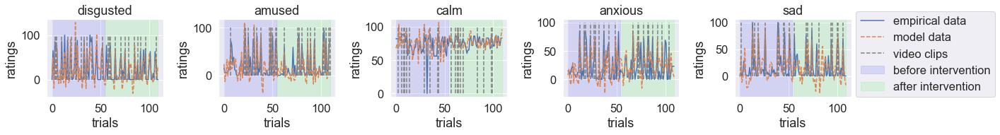

subject: 30, group: 1.0


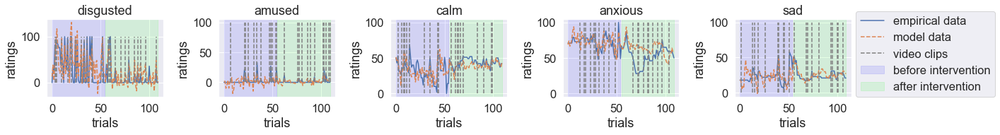

subject: 31, group: 1.0


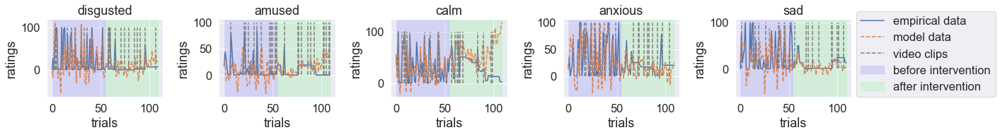

subject: 32, group: 1.0


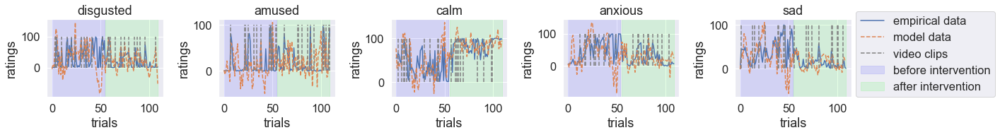

subject: 33, group: 1.0


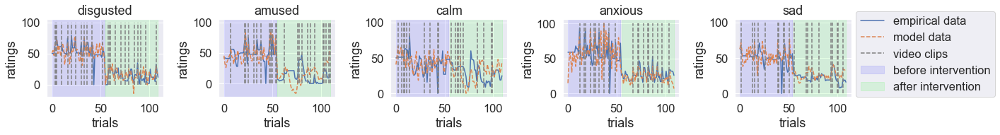

subject: 34, group: 1.0


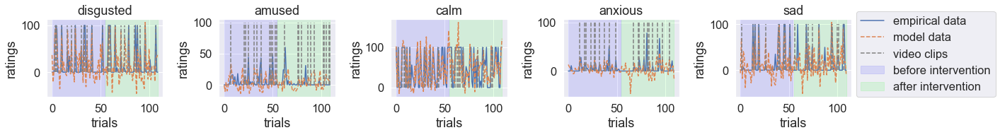

subject: 35, group: 0.0


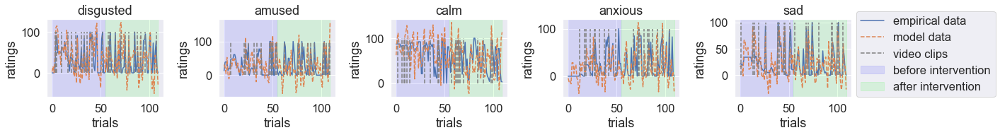

subject: 36, group: 1.0


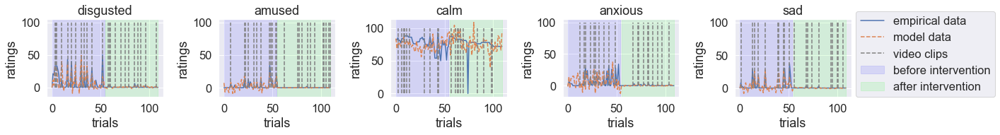

subject: 37, group: 0.0


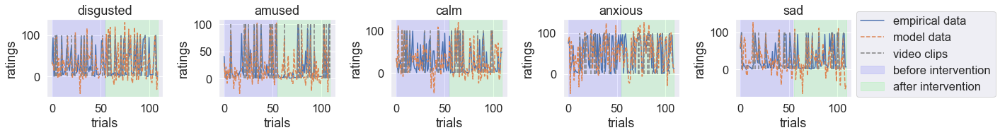

subject: 38, group: 1.0


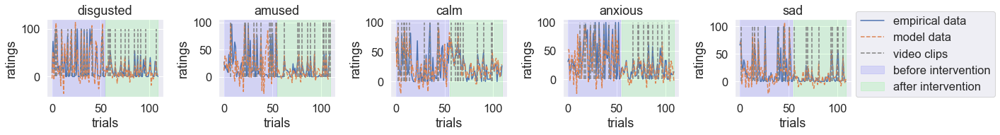

subject: 39, group: 1.0


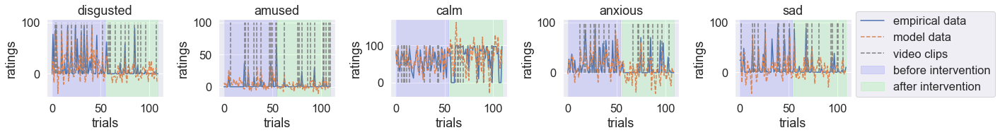

subject: 40, group: 1.0


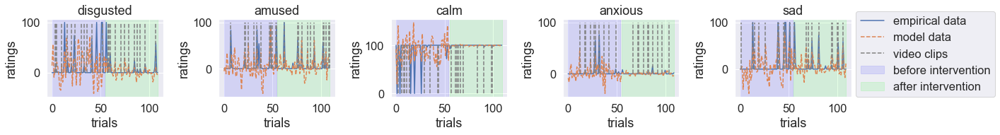

subject: 41, group: 1.0


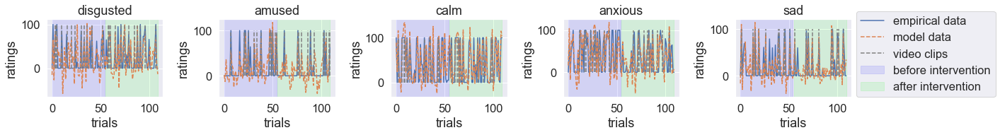

subject: 42, group: 0.0


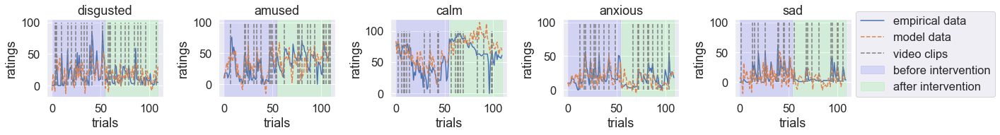

subject: 43, group: 1.0


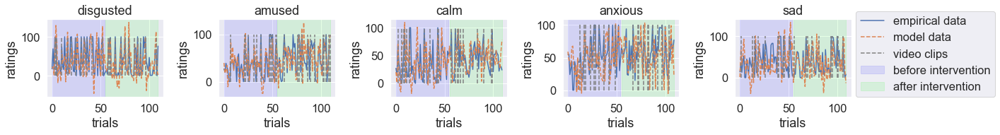

subject: 44, group: 1.0


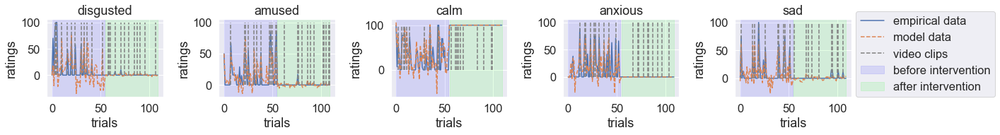

subject: 45, group: 1.0


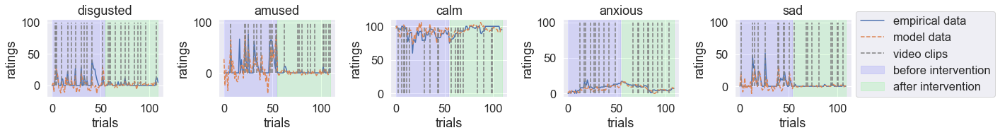

subject: 46, group: 1.0


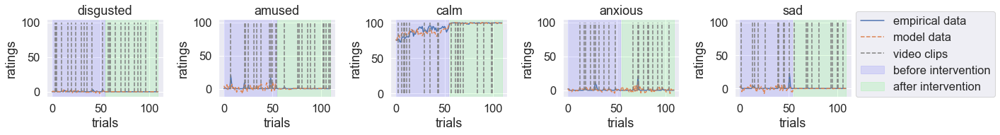

subject: 47, group: 1.0


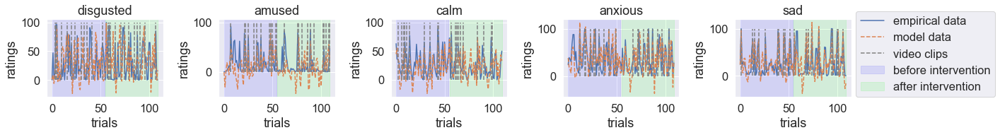

subject: 48, group: 0.0


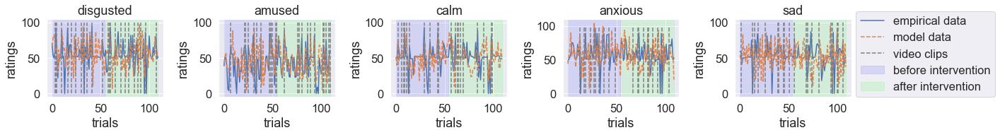

subject: 49, group: 0.0


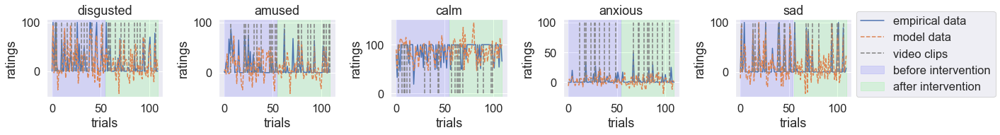

subject: 50, group: 0.0


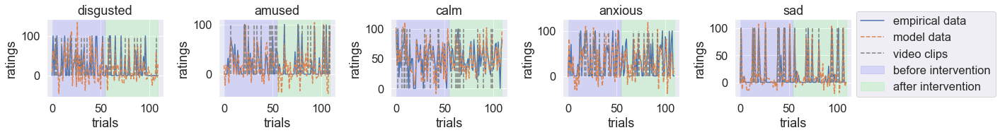

subject: 51, group: 1.0


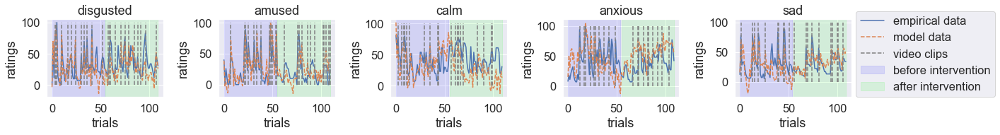

subject: 52, group: 1.0


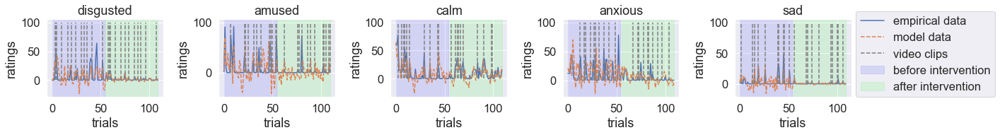

subject: 53, group: 1.0


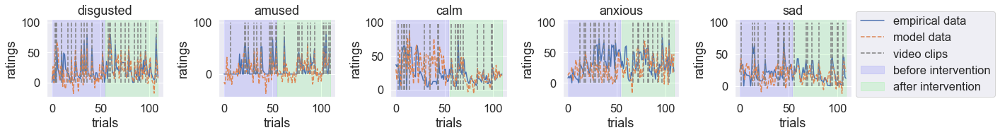

subject: 54, group: 0.0


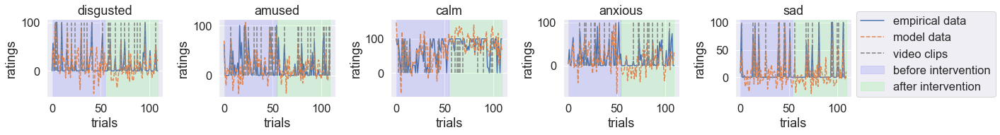

subject: 55, group: 0.0


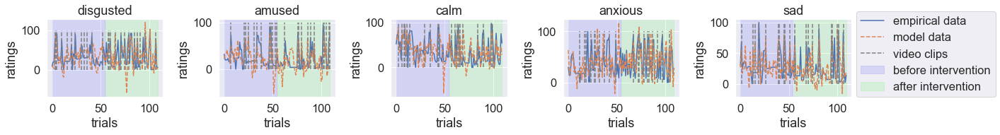

subject: 56, group: 0.0


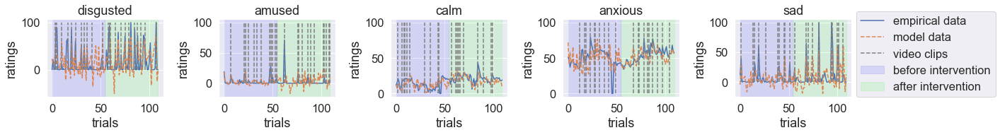

subject: 57, group: 0.0


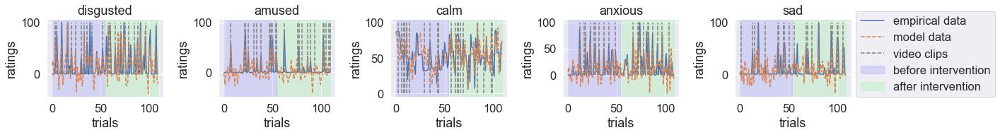

subject: 58, group: 0.0


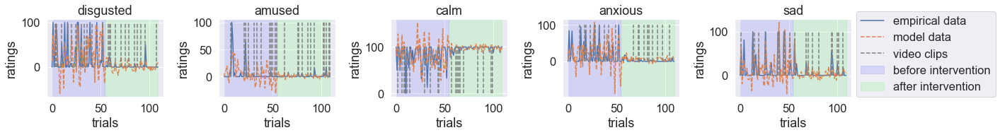

subject: 59, group: 1.0


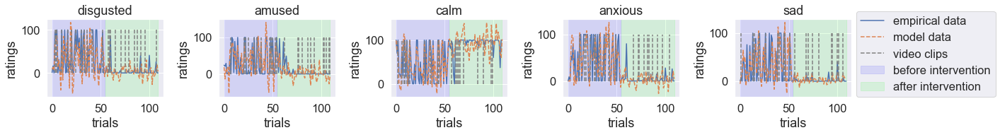

subject: 60, group: 0.0


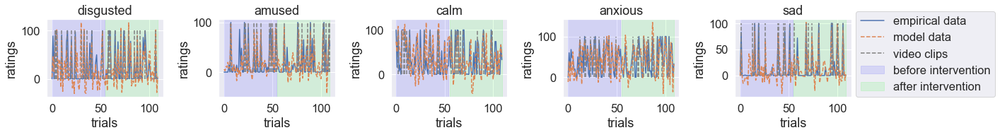

subject: 61, group: 1.0


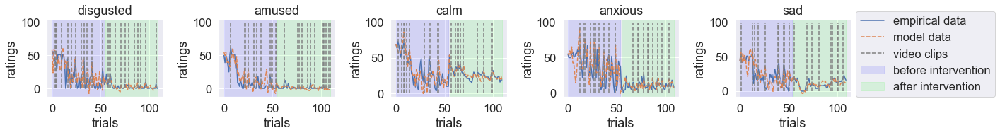

subject: 62, group: 1.0


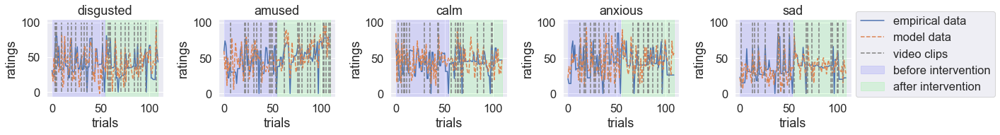

subject: 63, group: 0.0


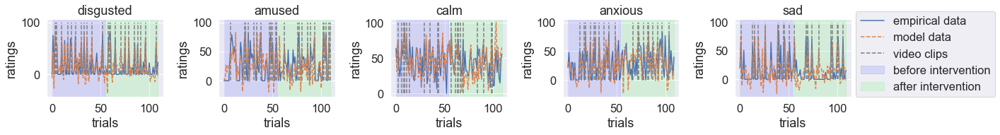

subject: 64, group: 1.0


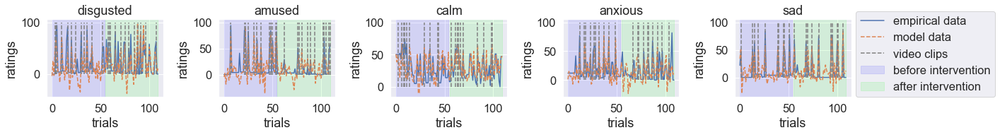

subject: 65, group: 1.0


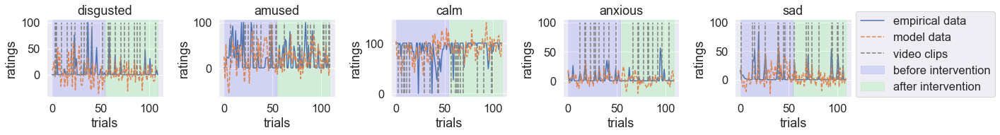

subject: 66, group: 1.0


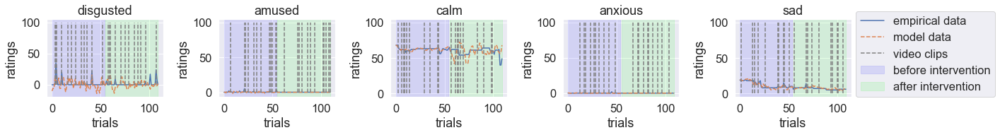

subject: 67, group: 1.0


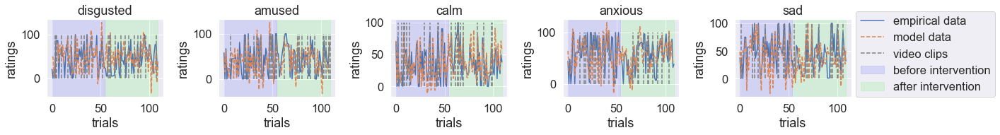

subject: 68, group: 0.0


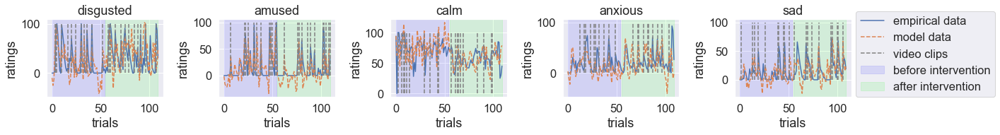

subject: 69, group: 1.0


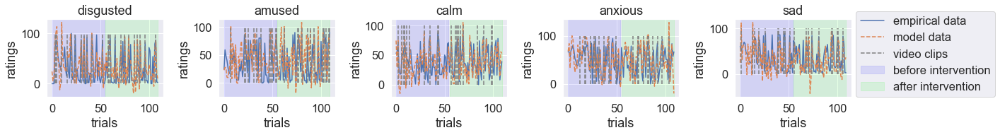

subject: 70, group: 1.0


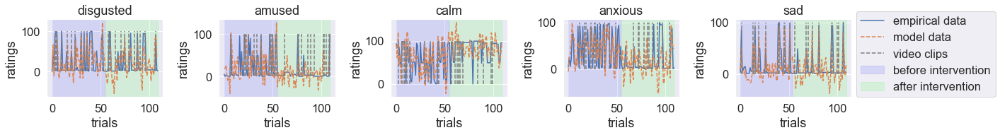

subject: 71, group: 0.0


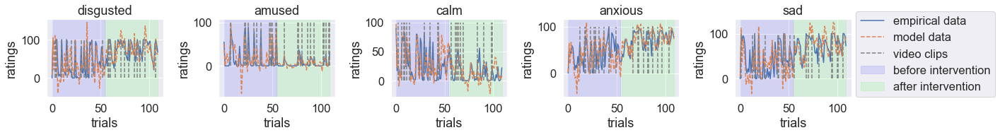

subject: 72, group: 0.0


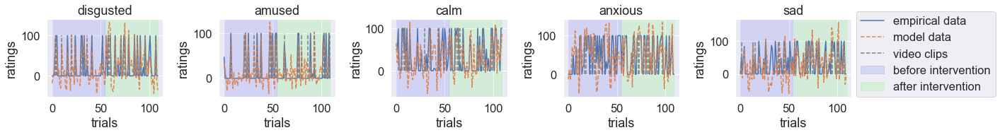

subject: 73, group: 1.0


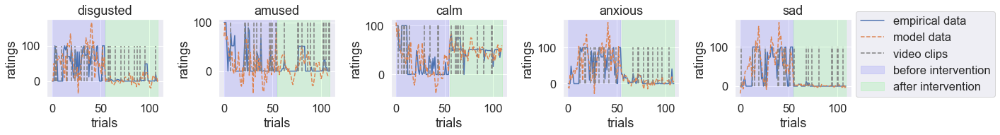

subject: 74, group: 1.0


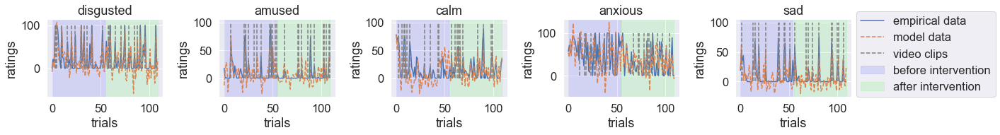

subject: 75, group: 0.0


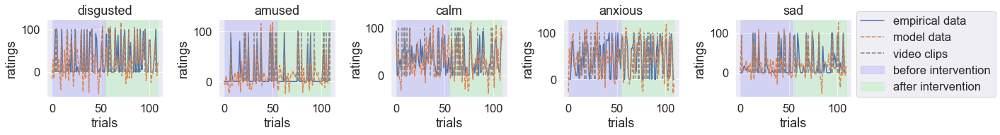

subject: 76, group: 1.0


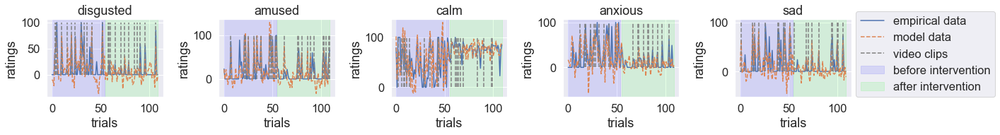

subject: 77, group: 1.0


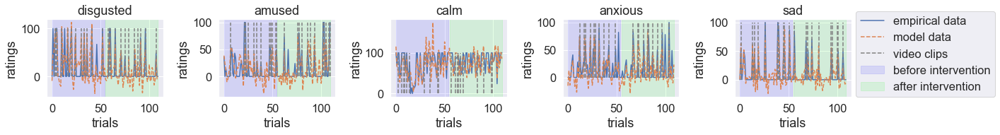

subject: 78, group: 0.0


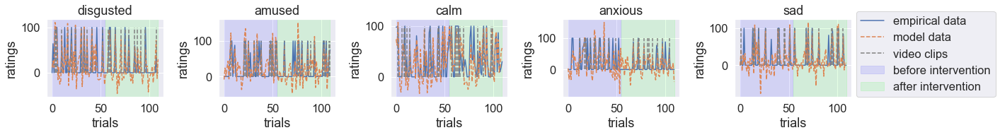

subject: 79, group: 0.0


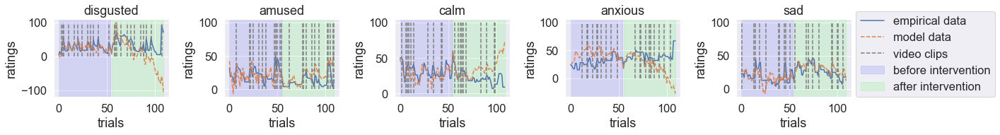

subject: 80, group: 1.0


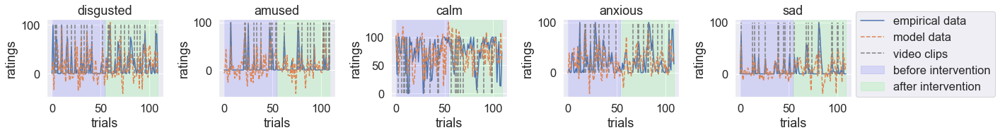

subject: 81, group: 1.0


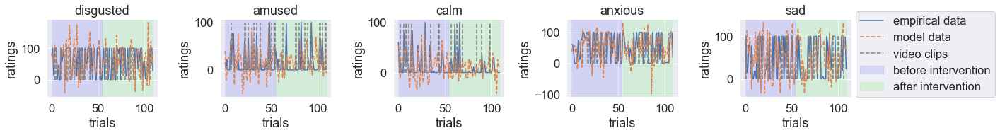

subject: 82, group: 0.0


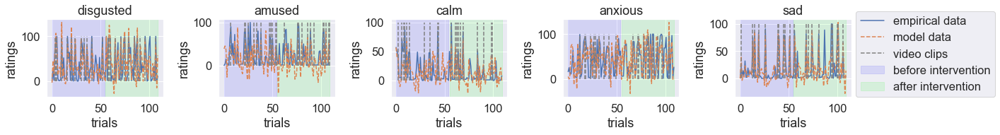

subject: 83, group: 1.0


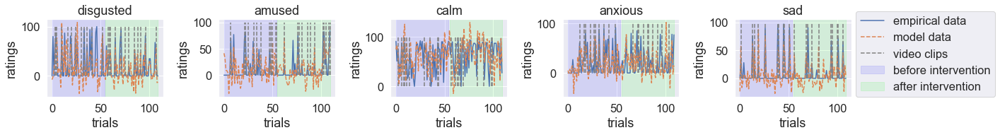

subject: 84, group: 0.0


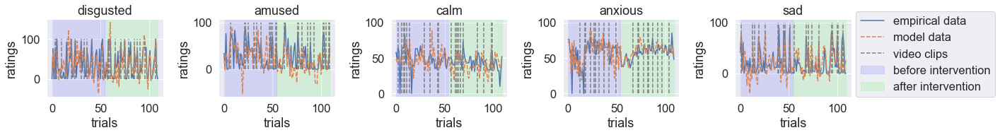

subject: 85, group: 1.0


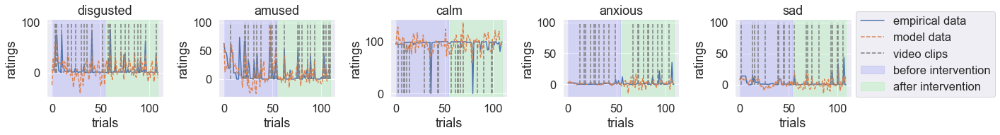

subject: 86, group: 0.0


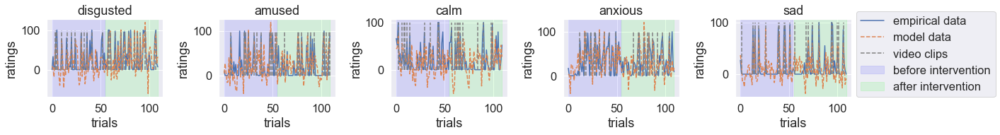

subject: 87, group: 0.0


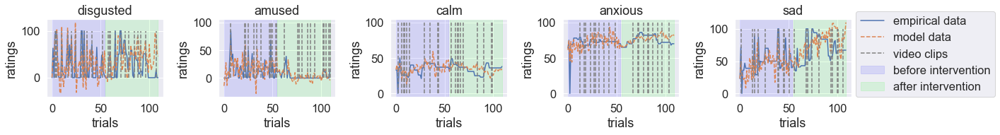

subject: 88, group: 0.0


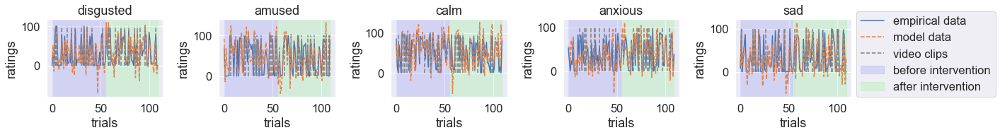

subject: 89, group: 0.0


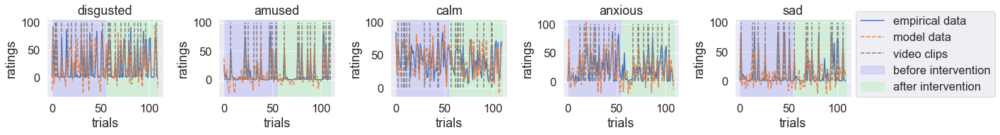

subject: 90, group: 0.0


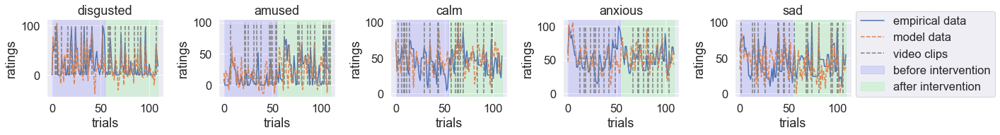

subject: 91, group: 1.0


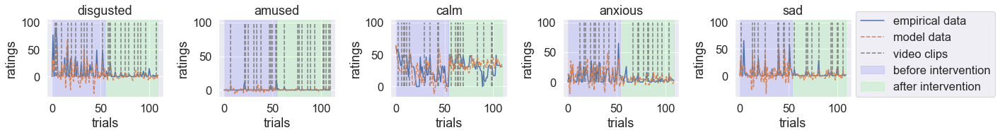

subject: 92, group: 0.0


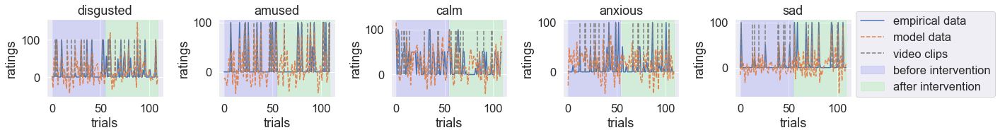

subject: 93, group: 0.0


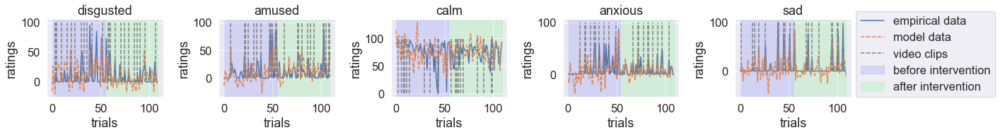

subject: 94, group: 0.0


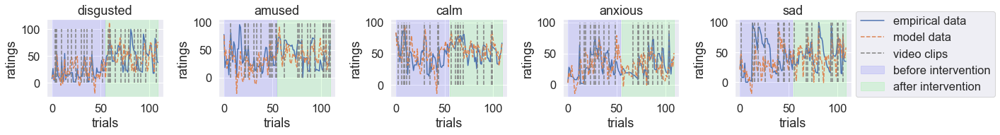

subject: 95, group: 1.0


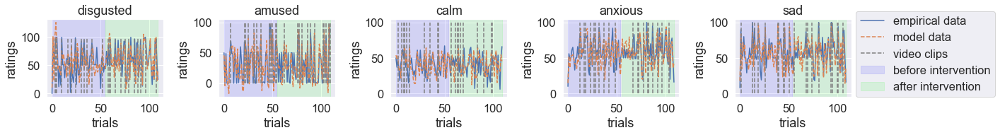

subject: 96, group: 0.0


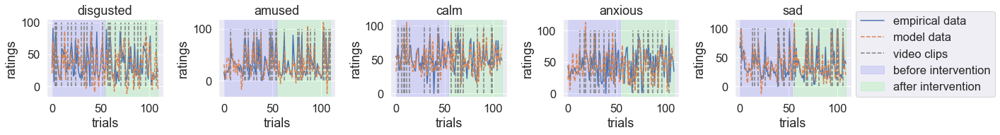

subject: 97, group: 0.0


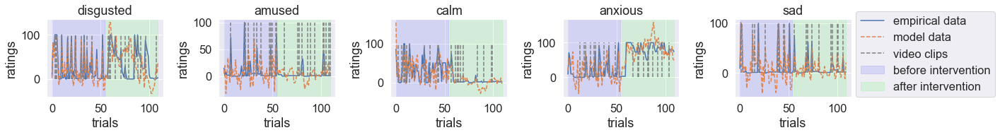

subject: 98, group: 0.0


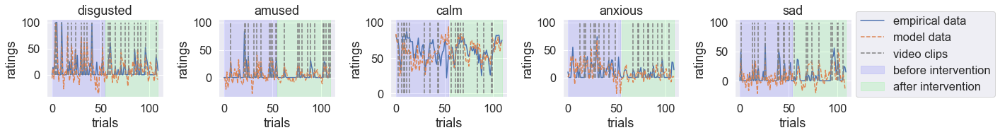

subject: 99, group: 0.0


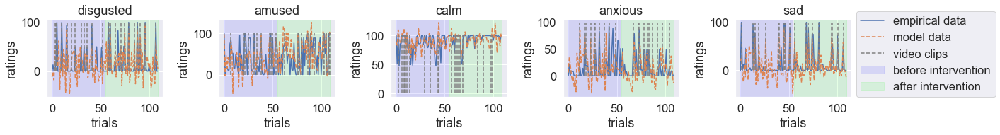

subject: 100, group: 0.0


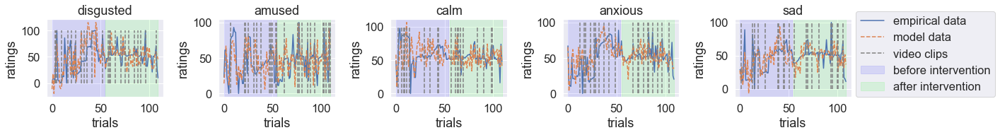

subject: 101, group: 0.0


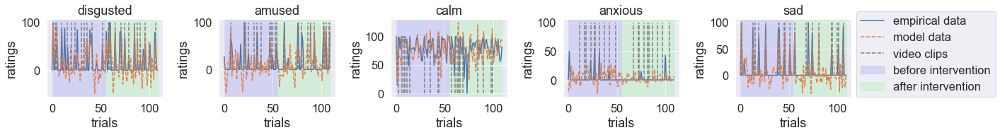

subject: 102, group: 1.0


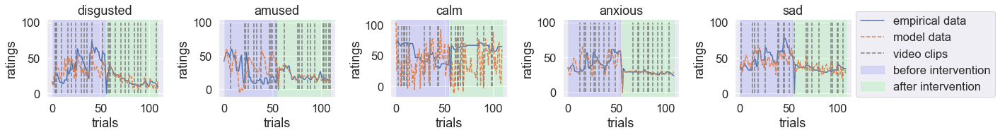

subject: 103, group: 1.0


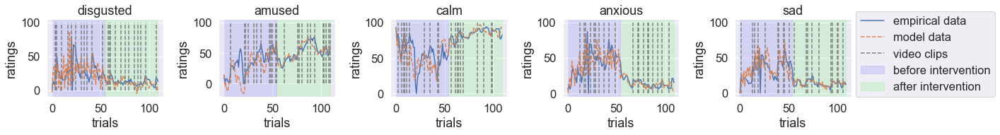

subject: 104, group: 1.0


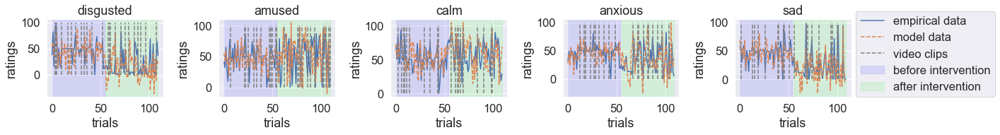

subject: 105, group: 1.0


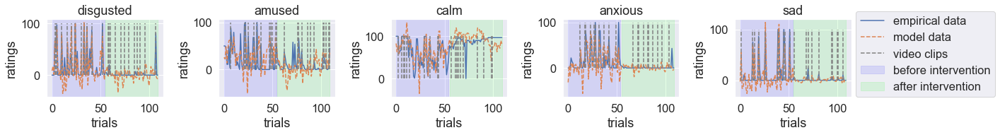

subject: 106, group: 1.0


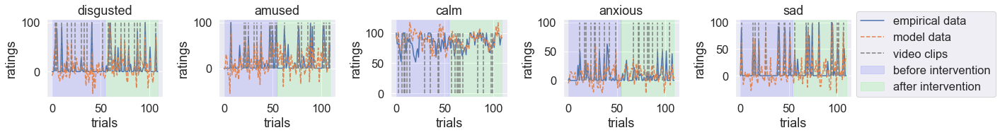

subject: 107, group: 1.0


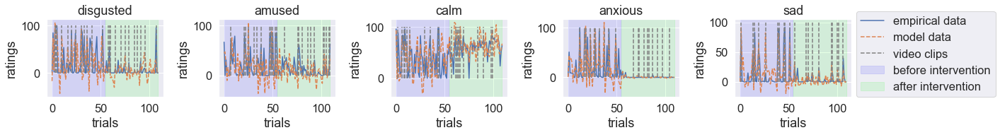

In [11]:
# Get the number of trials (T) from the data of the first subject (assuming it's available)
T = np.shape(data[0]['ratings'])[1]

# Loop through each subject
for sj in range(Nsj):
    # Print the subject index (sj) and their randomized condition from the dataframe 'df'
    print('subject: ' + str(sj) + ', group: ' + str(df['randomized_condition'][sj]))

    # Create subplots for each mood category to compare empirical data and model data
    fig, axs = plt.subplots(1, len(mood_categories), figsize=[20, 3])

    # Create an empty array 'x' to store the model results for each subject and each mood category
    x = np.empty((T, 5))

    # Loop through two halves of the trials (assuming even number of trials)
    for t in range(2):
        # Split the input data into two halves
        inp_split = inp[t * int(T / 2): t * int(T / 2) + int(T / 2), :]

        # Sample the model results for the second half of trials using the initial state from the subject's ratings
        z, x[t * int(T / 2): t * int(T / 2) + int(T / 2), :] = \
        data[sj]['results_split'][13 + t].sample(int(T / 2), initial_state=data[sj]['ratings'][:, t * int(T / 2)], \
                                                control_inputs=inp_split)

    # Loop through each mood category and plot the empirical data and model data for the current subject
    for k in range(len(mood_categories)):
        axs[k].plot(mood_ratings[:, k, sj])
        axs[k].plot(x[:, k], linestyle='--')
        axs[k].set_title(mood_categories[k])
        axs[k].set_ylabel('ratings')
        axs[k].set_xlabel('trials')

        # Add vertical lines to indicate the video clips in the plot
        axs[k].vlines(np.where(inp[:, k]), ymin=0, ymax=100, color='gray', linestyles='dashed')

        # Add colored rectangles to the plot to indicate before and after intervention
        ylim = axs[k].get_ylim()
        axs[k].add_patch(plt.Rectangle((0, ylim[0]), 54, np.abs(ylim[0]) + ylim[1], edgecolor=(0, 0, 1, 0.1), facecolor=(0, 0, 1, 0.1)))
        axs[k].add_patch(plt.Rectangle((55, ylim[0]), 54, np.abs(ylim[0]) + ylim[1], edgecolor=(0, 1, 0, 0.1), facecolor=(0, 1, 0, 0.1)))

    # Add legend and adjust the layout of the subplots
    plt.legend(['empirical data', 'model data', 'video clips', 'before intervention', 'after intervention'], loc=(1.04, 0))
    plt.tight_layout()

    # Uncomment if you want to save the plot as an image file
    # plt.savefig(filepath + 'results/figures/modelfit_normalized' + str(sj) + '.png')

    # Show the plot
    plt.show()
